# HYSPLIT Modeling V3

This notebook represents the second version of the HYSPLIT modeling scripts. Currently in use are several functions within a related package called hypy.py. Please make sure to have this python file in the working directory of this notebook alongside a working installation of HYSPLIT and related NARR files.

Checklist: 
1. Only run simulations on unique chemical, location, combinations. - DONE
2. Figure out what this bug is that is causing some of the windows to not have data available {TODO}
3. See if it's possible to parallel the code//see how much faster it is on linux. - WORKING ON BRENT
4. Figure out a way to bring all the data onto the server. - WORKING ON BRENT
5. Concatenation of output file from shapes into grid. Merge together outputs

In [1]:
#Libraries Utilized: 
#USE Lab env!
#%load_ext autoreload
#%autoreload 2

#Basic py: 
import numpy as np
import pandas as pd
import datetime
import os
import glob
import shutil
from pathlib import Path

#Vis
import matplotlib.pyplot as plt

#Geo
import geopandas as gpd
import fiona
from shapely.geometry import Point
import descartes
import contextily as ctx #Basemaps 
import rtree

#Custom Functions:
from hypy import HYSPLIT_configure, RSEI_merger_2,RSEI_merger, hysplit_input_conversion, chem_date_comb,chem_date_comb_2,uniq_fac_calc

## Preprocess the TRI Data

In [2]:
#Load the Data
tri_df = pd.read_csv('TRI_Carc_FSRel_9099.csv').drop(columns =['sumer','Unnamed: 0'])
#Half Life Data
TRI_chem_info = pd.read_csv('TRI_Carc_Half_Lives.csv')
#RSEI Data for the stack heights and velocity
RSEI_fac_df = pd.read_csv("./RSEI_Facility_Data.csv")

#Keep only those entries with complete information
TRI_chems = TRI_chem_info.dropna(subset = ['CAS'])
TRI_chems = TRI_chems.rename(columns = {'Unnamed: 8':'Phase'})

#Merge that data onto the tri dataframe
tri_df = pd.merge(tri_df,TRI_chem_info,left_on ='CAS#/COMPOUNDID',right_on = 'CAS',how='left')
tri_df = tri_df.drop(columns = ['CAS','Chems','88-ONE-TIMERELEASE'])

#Merge on the RSEI Data
tri_df = RSEI_merger_2(RSEI_fac_df,tri_df)

/home/boogie2/anaconda3/envs/lab_basic/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3062: DtypeWarning: Columns (19,23,30,31) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
#Seperate into the known differential modeling variants:
fug_par_df = tri_df[(tri_df['51-FUGITIVEAIR']>0) & (tri_df['Particle']==1)]
fug_gas_df = tri_df[(tri_df['51-FUGITIVEAIR']>0) & (tri_df['Gas']==1) ]
stack_par_df = tri_df[(tri_df['52-STACKAIR']>0) & (tri_df['Particle']==1)]
stack_gas_df = tri_df[(tri_df['52-STACKAIR']>0) & (tri_df['Gas']==1) ]

print('Fugitive Particle Releases shape: ' + str(fug_par_df.shape))
print('Total number of unique chemicals: '+str(fug_par_df['CAS#/COMPOUNDID'].drop_duplicates().shape))
print('Total number of unique polluters: '+str(fug_par_df['FRSID'].drop_duplicates().shape))

print('\nFugitive Gas Releases shape: ' + str(fug_gas_df.shape))
print('Total number of unique chemicals: '+str(fug_gas_df['CAS#/COMPOUNDID'].drop_duplicates().shape))
print('Total number of unique polluters: '+str(fug_gas_df['FRSID'].drop_duplicates().shape))

print('\nStack Particle Releases shape: ' + str(stack_par_df.shape))
print('Total number of unique chemicals: '+str(stack_par_df['CAS#/COMPOUNDID'].drop_duplicates().shape))
print('Total number of unique polluters: '+str(stack_par_df['FRSID'].drop_duplicates().shape))

print('\nStack Gas Releases shape: ' + str(stack_gas_df.shape))
print('Total number of unique chemicals: '+str(stack_gas_df['CAS#/COMPOUNDID'].drop_duplicates().shape))
print('Total number of unique polluters: '+str(stack_gas_df['FRSID'].drop_duplicates().shape))

#Expect:
#Fugitive Particle Releases shape: (195, 30)
#Total number of unique chemicals: (9,)
#Total number of unique polluters: (40,)

#Fugitive Gas Releases shape: (526, 30)
#Total number of unique chemicals: (20,)
#Total number of unique polluters: (75,)

#Stack Particle Releases shape: (148, 30)
#Total number of unique chemicals: (6,)
#Total number of unique polluters: (27,)

#Stack Gas Releases shape: (483, 30)
#Total number of unique chemicals: (17,)
#Total number of unique polluters: (72,)

Fugitive Particle Releases shape: (195, 36)
Total number of unique chemicals: (9,)
Total number of unique polluters: (40,)

Fugitive Gas Releases shape: (526, 36)
Total number of unique chemicals: (20,)
Total number of unique polluters: (75,)

Stack Particle Releases shape: (148, 36)
Total number of unique chemicals: (6,)
Total number of unique polluters: (27,)

Stack Gas Releases shape: (483, 36)
Total number of unique chemicals: (17,)
Total number of unique polluters: (72,)


## Increasing Efficiency: Addressing Duplicate Values

This code maps any releases which have the same release type, stackheight, year, latitude and longitude. Any duplicates are indexed and stored so no identical models are not run. This is most usable for the gas emissions as the particle emission may have additional unique parameters. 

In [4]:
#Filter the releases. This using a custom built function. See HYPY.py for documentation. 
fug_par_df,fug_par_df_no_dup,fug_par_overlap= uniq_fac_calc(fug_par_df,
                               columns=['51-FUGITIVEAIR','YEAR','LATITUDE','LONGITUDE'])

fug_gas_df,fug_gas_df_no_dup,fug_gas_overlap= uniq_fac_calc(fug_gas_df,
                               columns=['51-FUGITIVEAIR','YEAR','LATITUDE','LONGITUDE'])

stack_par_df,stack_par_df_no_dup,stack_par_overlap= uniq_fac_calc(stack_par_df,
                               columns=['52-STACKAIR','StackHeight','YEAR','LATITUDE','LONGITUDE'])

stack_gas_df,stack_gas_df_no_dup,stack_gas_overlap= uniq_fac_calc(stack_gas_df,
                               columns=['52-STACKAIR','StackHeight','YEAR','LATITUDE','LONGITUDE'])

/home/boogie2/Hanson_Lab/Environmental_Exposome/TRI/hypy.py:493: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  old_df['duplicate_index'] = old_df.groupby(columns).ngroup()


In [5]:
print('Percentage of fugitive particle releases which have identical releases and locations: {0:0.2f}%'.format(
    fug_par_overlap*100))
print('Percentage of fugitive gas releases which have identical releases and locations: {0:0.2f}%'.format(
    fug_gas_overlap*100))
print('Percentage of stack particle releases which have identical releases and locations: {0:0.2f}%'.format(
    stack_par_overlap*100))
print('Percentage of stack gas releases which have identical releases and locations: {0:0.2f}%'.format(
    stack_gas_overlap*100))

Percentage of fugitive particle releases which have identical releases and locations: 4.10%
Percentage of fugitive gas releases which have identical releases and locations: 5.51%
Percentage of stack particle releases which have identical releases and locations: 0.68%
Percentage of stack gas releases which have identical releases and locations: 4.97%


In [6]:
#Revaluate the shape of the new data
print('Fugitive Particle Releases shape: ' + str(fug_par_df_no_dup.shape))
print('Total number of unique chemicals: '+str(fug_par_df_no_dup['CAS#/COMPOUNDID'].drop_duplicates().shape))
print('Total number of unique polluters: '+str(fug_par_df_no_dup['FRSID'].drop_duplicates().shape))

print('\nFugitive Gas Releases shape: ' + str(fug_gas_df_no_dup.shape))
print('Total number of unique chemicals: '+str(fug_gas_df_no_dup['CAS#/COMPOUNDID'].drop_duplicates().shape))
print('Total number of unique polluters: '+str(fug_gas_df_no_dup['FRSID'].drop_duplicates().shape))

print('\nStack Particle Releases shape: ' + str(stack_par_df_no_dup.shape))
print('Total number of unique chemicals: '+str(stack_par_df_no_dup['CAS#/COMPOUNDID'].drop_duplicates().shape))
print('Total number of unique polluters: '+str(stack_par_df_no_dup['FRSID'].drop_duplicates().shape))

print('\nStack Gas Releases shape: ' + str(stack_gas_df_no_dup.shape))
print('Total number of unique chemicals: '+str(stack_gas_df_no_dup['CAS#/COMPOUNDID'].drop_duplicates().shape))
print('Total number of unique polluters: '+str(stack_gas_df_no_dup['FRSID'].drop_duplicates().shape))


Fugitive Particle Releases shape: (187, 37)
Total number of unique chemicals: (9,)
Total number of unique polluters: (40,)

Fugitive Gas Releases shape: (497, 37)
Total number of unique chemicals: (20,)
Total number of unique polluters: (75,)

Stack Particle Releases shape: (147, 37)
Total number of unique chemicals: (6,)
Total number of unique polluters: (27,)

Stack Gas Releases shape: (459, 37)
Total number of unique chemicals: (17,)
Total number of unique polluters: (72,)


**Conclusions:**

1. There are no losses in the total number of unique chemicals or polluters as expected.
2. The perecentage loss in total number of rows is accurately showecased by the percentages above. 
3. In total this removes ~250,000 model simulations saving more time
    - old model: ~4000000 simulations * 7.8seconds/60seconds/60 minutes/24 hours = ~360 days
    - new model: ~3650000 simulations * 7.8seconds/60seconds/60 minutes/24 hours = ~338 days

In [7]:
#Average number of releases per location, rounded to nearest whole number: 
print('Average number of Fugitive Particle Releases: {0:1.0f}'.format(fug_par_df_no_dup.groupby(['FRSID']).size().mean()))
print('Average number of Fugitive Gas Releases: {0:1.0f}'.format(fug_gas_df_no_dup.groupby(['FRSID']).size().mean()))
print('Average number of Stack Particle Releases: {0:1.0f}'.format(stack_par_df_no_dup.groupby(['FRSID']).size().mean()))
print('Average number of Stack Gas Releases: {0:1.0f}'.format(stack_gas_df_no_dup.groupby(['FRSID']).size().mean()))

Average number of Fugitive Particle Releases: 5
Average number of Fugitive Gas Releases: 7
Average number of Stack Particle Releases: 5
Average number of Stack Gas Releases: 6


## Validation: EPA Monitors

The EPA has several monitors which track chemicals within the air. We aim to use these monitors to evaluate the model we develop as they will represent a "ground truth" for carcinogen passing. Note, these analysis will not be able to be performed on the grid data as it is a summation of exposures. Instead, these will examine the output at a specific time, for all chemicals produced and existing in that space. 

The following code explores the sensor overlap (via location and chemical) for the EPA sensors and the TRI source emission location.

In [8]:
#Import the data:
#Appears there are monitors which did not record over the time period of interest. 
EPA_mon = pd.read_csv('./TRIChemicals_Monitors.csv')

#Collect only monitors which have a first year below 1990 and a last year above 1999 (all have complete coverage!)
valid_monitors = EPA_mon[(EPA_mon['first_year']<=1990) & (EPA_mon['last_year']>=1999)]

#it appears there are no 1:1 matches for latitude or longitude --> let's find the closest 

In [9]:
#Which TRI Chemicals are covered? 
print('Total number of monitors recording from 1990-1999: {0}'.format(valid_monitors.shape[0]))

print('\nEPA tracked chemicals: ')
print(*valid_monitors['chemicalname'].drop_duplicates().values, sep = ", ")



Total number of monitors recording from 1990-1999: 19

EPA tracked chemicals: 
LEAD, NICKEL, CADMIUM, COBALT


In [10]:
def epa_percent(epa_cas,df):
    """Takes a dataframe, finds the total percentage of chemicals within epa_cas, then returns a series of these percentages, rounded to 2 decimals.
    ===
    Inputs:
    1. epa_cas = a list of chemicals for which you are interested in knowing the percentage of occurence within another dataset
    2. df = the target dataframe 

    Outputs: 
    1. pandas series of percentages 
    """
    #Select the CAS#'s from this list 
    df_overlap = df[df['CAS#/COMPOUNDID'].isin(epa_cas)].groupby(['CHEMICAL']).count()
    #Make value a percentage
    return (round(df_overlap['Group']/df.shape[0],2)).rename('total (%)')

In [11]:
#Create a list of the EPA cas numbers
epa_cas = valid_monitors['casnumber'].str.replace('-','')

fug_par_overlap = epa_percent(epa_cas,fug_par_df)
fug_gas_overlap = epa_percent(epa_cas,fug_gas_df)
stack_par_overlap = epa_percent(epa_cas,stack_par_df)
stack_gas_overlap = epa_percent(epa_cas,stack_gas_df)

overlap = pd.concat([fug_par_overlap,
                     fug_gas_overlap,
                     stack_par_overlap,
                     stack_gas_overlap],
                     axis=1)
overlap.columns = ['fug_par_total_%',
                    'fug_gas_total_%',
                    'stack_par_total_%',
                    'stack_pgas_total_%']
overlap
                

,fug_par_total_%,fug_gas_total_%,stack_par_total_%,stack_pgas_total_%
CADMIUM,0.03,NaN,0.04,NaN
COBALT,0.06,NaN,NaN,NaN
LEAD,0.10,NaN,0.22,NaN
NICKEL,0.38,NaN,0.24,NaN


In [38]:
#First need to sort the EPA sensors by ID to see which chemicals are at which facilities
valid_monitors['casnumber'] = valid_monitors['casnumber'].str.replace('-','')
epa_sensors_locs = valid_monitors.groupby(['latitude','longitude'])['casnumber'].apply(list)
epa_sensors_locs = epa_sensors_locs.reset_index()

#Gather the CAS numbers for the unique chemicals (EPA sensors)
unique_cas = epa_sensors_locs['casnumber'].to_list()
unique_cas = [item for sublist in unique_cas for item in sublist]
unique_cas =list(dict.fromkeys(unique_cas))

<ipython-input-38-9ce258125147>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_monitors['casnumber'] = valid_monitors['casnumber'].str.replace('-','')


In [39]:
#First calculate the TRI emitters which are closest to the origin source AND have chemicals within the list of TRI emitters 
locs = tri_df.drop_duplicates(subset=['LATITUDE','LONGITUDE'])
a= []
for idx in range(epa_sensors_locs.shape[0]):
    temp =valid_monitors.iloc[idx]
    locs['euc_dist']= np.linalg.norm((locs[['LATITUDE','LONGITUDE']].values - temp[['latitude','longitude']].values).astype('float64'),
               axis=1)
    a.append(locs[locs['CAS#/COMPOUNDID'].isin(epa_sensors_locs['casnumber'].iloc[idx])].sort_values(by='euc_dist').iloc[0])

nearest = pd.concat([valid_monitors.reset_index(),pd.DataFrame(a).reset_index()],axis=1)
nearest = nearest.drop(columns=['index'])

<ipython-input-39-0230b0892983>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  locs['euc_dist']= np.linalg.norm((locs[['LATITUDE','LONGITUDE']].values - temp[['latitude','longitude']].values).astype('float64'),


In [40]:
#Collect the FRSIDs and merge them with the EPA sensors
EPA_w_FRSID = nearest.drop_duplicates(subset=['latitude','longitude']).groupby(['latitude','longitude'])['FRSID','euc_dist'].first().reset_index()
epa_sensors_locs = pd.merge(epa_sensors_locs, EPA_w_FRSID,  how='inner', on=['latitude','longitude'])
epa_sensors_locs = epa_sensors_locs.rename(columns = {'FRSID':'Nearest_FRSID'})
epa_sensors_locs.head(3)

<ipython-input-40-c16e22b68556>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  EPA_w_FRSID = nearest.drop_duplicates(subset=['latitude','longitude']).groupby(['latitude','longitude'])['FRSID','euc_dist'].first().reset_index()


,latitude,longitude,casnumber,Nearest_FRSID,euc_dist
0,37.618382,-112.17437,"[7439921, 7440020]",1.100005e+11,2.624267
1,38.458321,-109.82126,"[7439921, 7440020]",1.100158e+11,1.714310
2,38.778313,-109.59818,"[7439921, 7440020]",1.100158e+11,1.345195


In [41]:
#Check the overlap:  
FRS_ID_w_epa_chem = tri_df[tri_df['CAS#/COMPOUNDID'].isin(unique_cas)].groupby(['FRSID'])['CAS#/COMPOUNDID'].apply(list)
merger = pd.merge(epa_sensors_locs, FRS_ID_w_epa_chem, how='left', right_on=['FRSID'],left_on = 'Nearest_FRSID')

In [102]:
#Now we need to go collect these TRI releases (location and release etc)
data = []
for idx in range(merger.shape[0]):
    tmp = tri_df[(tri_df['FRSID']==merger['Nearest_FRSID'].iloc[idx]) & (tri_df['CAS#/COMPOUNDID'].isin(merger['CAS#/COMPOUNDID'].iloc[idx]))]
    tmp = tmp.groupby(by = ['FRSID']).agg({'YEAR':['min','max'],
                                    'TRIFD':'first',
                                    'CAS#/COMPOUNDID':'first',
                                    'CHEMICAL':'first',
                                    'Gas':'first',
                                    'Particle':'first',
                                    'LATITUDE':'first',
                                    'LONGITUDE':'first'}).reset_index()  
    data.append(tmp)

data = pd.concat(data)
end = pd.merge(data,merger, how ='inner',left_on='FRSID',right_on='Nearest_FRSID').drop(columns = ['CAS#/COMPOUNDID','Nearest_FRSID'])
#Rename the columns
end.columns = ['FRSID',
                   'YEAR_min',
                   'YEAR_max',
                   'TRIFD',
                   'CAS',
                   'CHEM',
                   'GAS',
                   'PARTICLE',
                   'LATITUDE',
                   'LONGITUDE',
                   'EPA_latitude',
                   'EPA_longitude',
                   'casnumber',
                   'euc_dist']


#There are some in southern utah, but these are way too far off to be helpful. 
end = end[end.euc_dist<1]
end

/home/boogie2/anaconda3/envs/lab_basic/lib/python3.8/site-packages/pandas/core/reshape/merge.py:618: UserWarning: merging between different levels can give an unintended result (2 levels on the left, 1 on the right)
  warnings.warn(msg, UserWarning)


,FRSID,YEAR_min,YEAR_max,TRIFD,CAS,CHEM,GAS,PARTICLE,LATITUDE,LONGITUDE,EPA_latitude,EPA_longitude,casnumber,euc_dist
5,110000770130,1994,1996,84107SMPSN120WF,7440020,NICKEL,0.0,1.0,40.677996,-111.894597,40.646667,-111.84972,[7439921],0.054731
6,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.704445,-111.96861,"[7439921, 7440020, 7440439, 7440484]",0.425217
7,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.755280,-111.88556,"[7439921, 7440020, 7440439, 7440484]",0.435148
8,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.758331,-111.89806,[7439921],0.442270
9,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.704445,-111.96861,"[7439921, 7440020, 7440439, 7440484]",0.425217
10,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.755280,-111.88556,"[7439921, 7440020, 7440439, 7440484]",0.435148
11,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.758331,-111.89806,[7439921],0.442270
12,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.704445,-111.96861,"[7439921, 7440020, 7440439, 7440484]",0.425217
13,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.755280,-111.88556,"[7439921, 7440020, 7440439, 7440484]",0.435148
14,110011800319,1990,1990,84042NTRMN1085W,7439921,LEAD,0.0,1.0,40.344310,-111.742530,40.758331,-111.89806,[7439921],0.442270


/home/boogie2/anaconda3/envs/lab_basic/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/boogie2/anaconda3/envs/lab_basic/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


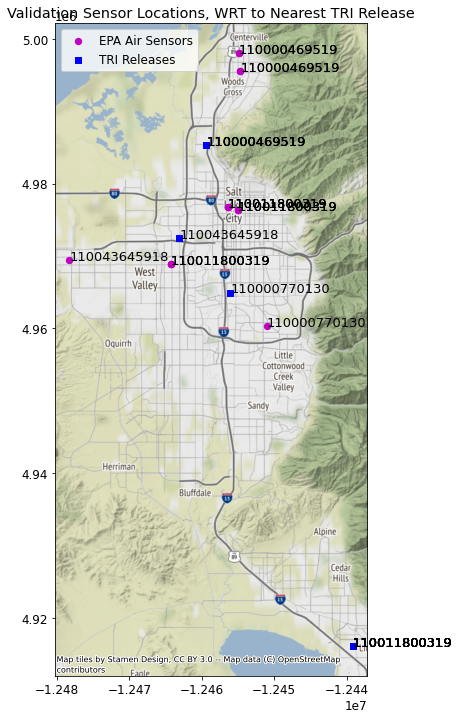

In [104]:
#Plot the two points in each dataframe
EPA = gpd.GeoDataFrame(end,
                       geometry=gpd.points_from_xy(x=end.EPA_longitude, y=end.EPA_latitude))

EPA.crs = {'init' :'epsg:4326'}
EPA = EPA.to_crs({'init': 'epsg:3857'})

TRI = gpd.GeoDataFrame(end, geometry=gpd.points_from_xy(x =end.LONGITUDE ,y=end.LATITUDE))
TRI.crs = {'init': 'epsg:4326'}
TRI = TRI.to_crs({'init': 'epsg:3857'})

#Plot the locations of the nearest sensors. 
fig,ax = plt.subplots(figsize=(12,12))
plt.rcParams.update({'font.size': 12})
#ax.set_xlim(-1.249e7, -1.24e7)
#ax.set_ylim(4950000, 5010000)

texts=[]
EPA.plot(ax = ax,color = 'm',markersize = 40,marker='o')
for x, y, label in zip(EPA.geometry.x, EPA.geometry.y, EPA["FRSID"]):
    texts.append(plt.text(x, y, label, fontsize = 13))
TRI.plot(ax = ax,color = 'b',markersize = 40,marker='s')
for x, y, label in zip(TRI.geometry.x, TRI.geometry.y, TRI["FRSID"]):
    texts.append(plt.text(x, y, label, fontsize = 13))
ax.legend(['EPA Air Sensors','TRI Releases'])
ax.set_title('Validation Sensor Locations, WRT to Nearest TRI Release')
ctx.add_basemap(ax)
plt.savefig('validation_sensors.png')

**Conclusions**

This plot is confusing. It needs work, hopefully align the colors with the chemicals emitted 

1. Each label showcases connects the release to its nearest analog, WHICH HAS EMITS THE CHEMICAL THE EPA SENSOR IS RECORDING.
2. Not all emitters release for 10 years (or so it might seem)
3. The most pertinent sensor pairs are for Nickel (and also have more than just one year!)
4. There are additional sensors which are in the southern portion of the state (x2) part are far from any TRI releases (nearest is over 100 miles).

## Date Mapping and Model Preperation

In [105]:
#Organize the data into daily releases
#fug_par_df_no_dup = chem_date_comb_2(data = fug_par_df_no_dup,
#                            freq = "3H",
#                            release_type = 'fugitive'
#                             )

print('\nProcessing Fugitive Gases')
fug_gas_df_no_dup = chem_date_comb_2(data = fug_gas_df_no_dup,
                            freq = "3H",
                            release_type = 'fugitive'
                             )

#stack_par_df_no_dup = chem_date_comb_2(data = stack_par_df_no_dup,
#                            freq = "3H",
#                            release_type = 'stack'
#                             )

print('\nProcessing Stack Gases')
stack_gas_df_no_dup = chem_date_comb_2(data = stack_gas_df_no_dup,
                            freq = "3H",
                            release_type = 'stack'
                             )


Processing Fugitive Gases
Percentage Complete: 0.00
Percentage Complete: 10.06
Percentage Complete: 20.12
Percentage Complete: 30.18
Percentage Complete: 40.24
Percentage Complete: 50.30
Percentage Complete: 60.36
Percentage Complete: 70.42
Percentage Complete: 80.48
Percentage Complete: 90.54

Processing Stack Gases
Percentage Complete: 0.00
Percentage Complete: 10.89
Percentage Complete: 21.79
Percentage Complete: 32.68
Percentage Complete: 43.57
Percentage Complete: 54.47
Percentage Complete: 65.36
Percentage Complete: 76.25
Percentage Complete: 87.15
Percentage Complete: 98.04


In [13]:
#Double Check the fill
print('Fugitive Particle Releases shape: ' + str(fug_par_df_no_dup.shape))
print('Fugitive Gas Releases shape: ' + str(fug_gas_df_no_dup.shape))
print('Stack Particle Releases shape: ' + str(stack_par_df_no_dup.shape))
print('Stack Gas Releases shape: ' + str(stack_gas_df_no_dup.shape))

#Previous shape before removal of duplicates: 
#Fugitive Particle Releases shape: (569704, 34)
#Fugitive Gas Releases shape: (1536712, 34)
#Stack Particle Releases shape: (432400, 34)
#Stack Gas Releases shape: (1411088, 34)

Fugitive Particle Releases shape: (187, 37)
Fugitive Gas Releases shape: (1452000, 39)
Stack Particle Releases shape: (147, 37)
Stack Gas Releases shape: (1340984, 39)


In [14]:
#Convert all inputs to usable metrics: 
#fug_par_prepped_df = hysplit_input_conversion(fug_par_df_no_dup,0)
fug_gas_prepped_df = hysplit_input_conversion(fug_gas_df_no_dup,0)
#stack_par_prepped_df = hysplit_input_conversion(stack_par_df_no_dup,1)
stack_gas_prepped_df = hysplit_input_conversion(stack_gas_df_no_dup,1)

### Filtering Data for Overlap 

In [15]:
stack_gas_prepped_df.head(3)

,date,Group,YEAR,TRIFD,FRSID,FACILITYNAME,CITY,COUNTY,ST,ZIP,...,Phase,StackHeight,StackVelocity,StackDiameter,StackHeightSource,StackVelocitySource,StackDiameterSource,duplicate_index,Release,HS_loc_input
0,1990-01-01,1,1990,84409LVLRN1330W,110009506766,LEVOLOR-KIRSCH WINDOW FASHIONS,OGDEN,WEBER,UT,84401,...,Gas,0.6,11.6,0.5,Fac Spec,Fac Spec,Fac Spec,105,0.085616,41.21 -112.01 0.6
1,1990-01-01,2B,1990,84302MRTNT9160N,110032607329,ATK LAUNCH SYSTEMS PROMONTORY,PROMONTORY,BOX ELDER,UT,84307,...,Liquid,9.1,7.3,0.9,Fac Spec,Fac Spec,Fac Spec,286,0.890411,41.66 -112.43 9.1
2,1990-01-01,2B,1990,84044HRCLS6800W,110020094351,HEXCEL CORP,WEST VALLEY CITY,SALT LAKE,UT,84119,...,Liquid,22.5,9.8,1.0,Fac Spec,Fac Spec,Fac Spec,419,11.181507,40.65 -112.05 22.5


In [16]:
#There are some duplicates in the data
#TODO
fug_gas_prepped_df[fug_gas_prepped_df.duplicated()][['FACILITYNAME','CAS#/COMPOUNDID','LATITUDE','LONGITUDE']].drop_duplicates()

,FACILITYNAME,CAS#/COMPOUNDID,LATITUDE,LONGITUDE


In [17]:
#Double check the naming scheme won't save over itself
#with this amount of information in the name, there will be no duplicates 
#except for the two facilities which have doubles coming in...but the overwrite should be ok for now. 

fug_gas_prepped_df[['date','FRSID','CAS#/COMPOUNDID','HS_loc_input']].drop_duplicates().shape

#Expect (1452000, 4)

(1452000, 4)

# Speed Testing: 

Trying lots of hyperparameters on a small number of entries. Per each hyperparameter, a test was run on three different chemicals from three different locations. Time was calculated as the average between the three. Each run was on the same chemicals. 

In [38]:
#This will only output the samples for the first 6 hours 
samp = fug_gas_prepped_df[fug_gas_prepped_df['date']<= '01/01/1990 00:00:00']

#This clears any existing directories which begin with HO 
if len(glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'))!=0:
    for dirs in glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'):
        try:
            shutil.rmtree(dirs)
        except:
            print('unable to delete ' + dirs)

counter = 0 
import timeit
start_time = timeit.default_timer()

for rows in range(samp.shape[0]):
    counter +=1
    release = str(samp.iloc[rows]['Release'])
    fac = str(samp.iloc[rows]['FRSID'])
    chem = str(samp.iloc[rows]['CAS#/COMPOUNDID'])
    lat_lon_height = str(samp.iloc[rows]['HS_loc_input'])
    date = str(samp.iloc[rows]['date'])
    year = date[2:4]
    month = date[5:7]
    day = date[8:10]
    hour = date[11:13]
    date = year+' '+month + ' '+day+' '+hour
    save_name = "HO"+"_"+fac +"_"+ chem  +"_"+ lat_lon_height.replace(' ', '_') +"_"+year+'_'+month+'_'+day+'_'+hour
    print(save_name)
    print(release)
    print(lat_lon_height)
    HYSPLIT_configure(start_model = date, 
                    num_loc = '1', 
                    start_locs = lat_lon_height, 
                    tot_runtime = '48', 
                    mod_top = '10000.0',
                    input_data_grids = '2',
                    grid_1_dir = "C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\NARR_Weather_Data\\",
                    grid_1_name = 'NARR199001',
                    grid_2_dir = 'C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\NARR_Weather_Data\\',
                    grid_2_name = 'NARR199002',
                    chem_ident = chem,
                    emis_rate = release,
                    emis_hours = '3.0000',
                    samp_interval = '00 3 00',
                    puff_or_part = '3',
                    particle_num = '100',
                    filename = save_name,
                    concplot_a = '1')
    
    if counter==3:
        break
        #print("Total Completed Runs: {0}".format(counter))
elapsed = timeit.default_timer() - start_time    

HO_110009506766_50000_41.21_-112.01_0.00_90_01_01_00
0.08561643835616438
41.21 -112.01 0.00
Script Completed
HO_110011800319_7664939_40.34_-111.74_0.00_90_01_01_00
0.2568493150684932
40.34 -111.74 0.00
Script Completed
HO_110000758378_7664939_41.26_-112.23_0.00_90_01_01_00
0.08561643835616438
41.26 -112.23 0.00
Script Completed


In [39]:
print(elapsed)
print('Time of calculation: {0:1.2f} seconds\n'.format(elapsed/3))

37.87247790000015
Time of calculation: 12.62 seconds



##### This chart is built with the idea that comparison runs are made on Greg's Work PC

| ID | Time (seconds per run)| Particle Number | Run Type | Mod Top | Concplot a | Run Date | Image Name| Notes |
|------|------|------|------|------|------|------|------|------|
|1|5.40| 500|0|500|Concplot|May 27th 2020|Run_1.png|This causes an error for example 2 and 3 which both have a much lower concentration than example 1|
|2|6.71| 500|0|1000|Concplot|May27th 2020|Run_2.png|Same Error as above ^|
|3|15.99|500|0|2000|Concplot|May 27th 2020|Run_3.png|No errors|
|4|14.48|500|0|4000|Concplot|May 27th 2020|Run_4.png|Error with plot 3, no concentration data|
|5|8.74|500|0|100|Concplot|May 27th 2020|Run_5.png|Errors within all plots. Still trying to figure out what the top of the model is relative to the grid defined model layer|
|6|5.71|100|0|2000|Concplot|May 27th 2020|Run_6.png|Error on plot 2, hour 42|
|7|10.17|1000|0|2000|Concplot|May 27th 2020|Run_7.png|Error on plot 2, hour 42|
|8|19.38|500|0|10000|Concplot|June 1st 2020|Run_8.png|Run with standard setting for modtop (10,000). Recieved one error on plot 2 at time step 3. Can see the missing data in plotting legend|
|9|13.08|1000|0|10000|Concplot|June 1st 2020|Run_9.png|Run with standard setting for modtop (10,000). Recieved one error on 110009506766 for timestep hours after 6 indicating no concentration information was relayed. |
|10|17.50|2000|0|10000|Concplot|June 1st 2020|Run_10.png|Run with standard setting for modtop (10,000). No Errors. |
|11|26.04|4000|0|10000|Concplot|June 1st 2020|Run_11.png|Run with standard setting for modtop (10,000). No Errors. |
|12|97.32|100|1|10000|Concplot|June 1st 2020|Run_12.png|Run with standard setting for modtop (10,000). No Errors.|
|13|80.95|100|1|10000|Concplot|June 1st 2020|Run_13.png|Run with standard setting for modtop (10,000). Same as above.|
|14|49.55|100|3|10000|Concplot|June 1st 2020|Run_14.png|Run with standard setting for modtop (10,000). Changed to different puff config (3)|
|15|7.74|100|3|10000|Concplot|June 1st 2020|Run_15.png|Reducing the size of the grid to 0.5 x 0.5 degrees, mutliple errors. Graphs look very rough.|
|16|40.72|50|3|10000|Concplot|June 1st 2020|Run_16.png|Grid size back to 0.05, errors on 110012347193 on last run|
|17|34.57|20|3|10000|Concplot|June 1st 2020|Run_17.png|Shrinking number of puffs, hybrid approach|
|18|38.42|10|3|10000|Concplot|June 1st 2020|Run_18.png|Shrinking number of puffs, hybrid approach, multiple file errors|
|19|36.68|2|3|10000|Concplot|June 1st 2020|Run_19.png|Shrinking number of puffs, multiple files still showing error|
|20|13.78|2|4|10000|Concplot|June 1st 2020|Run_20.png|Trying different modeling type, no reported errors|
|21|12.28|2|4|10000|Concplot|June 1st 2020|Run_21.png|No visual difference|
|22|24.00|100|4|10000|Concplot|June 1st 2020|Run_22.png|Shrinking the plotting area, so as to only include Utah|
|23|6.66|20|4|10000|Concplot|June 1st 2020|Run_23.png|Retrying the smaller puff number with new boundary, no errors, visually identical to the previous entry|
|24|15.29|100|3|10000|Concplot|June 1st 2020|Run_24.png|definite visual differences. Showcases difference between gaussian (3) and top hat (4) with particle vertical distribution|
|25|11.96|100|2|10000|Concplot|June 1st 2020|Run_25.png|Changing the puff mode to explore the best parameters for speed. Puff number should not matter. Results do not look accurate|
|26|17.06|100|0|10000|Concplot|June 1st 2020|Run_26.png|Changing puff mode (1), still appears very general. Double 
|27|9.74|2500|0|10000|Concplot|June 1st 2020|Run_27.png|Changing back to particle mode, no model errors|
|28|6.74|1000|0|10000|Concplot|June 1st 2020|Run_28.png|Decreasing number of particles, errors. This appears to be too few particles|
|29|13.44|5000|0|10000|Concplot|June 1st 2020|Run_29.png|Increasing number of particles, error encountered in first plot: 110000469476 (higher conc)|
|30|24.51|5000|0|10000|Concplot|June 1st 2020|Run_30.png|Increasing number of particles, no errors encountered. This appears to be getting to be too many particles)|
|31|16.34|100|3|10000|Concplot|June 22nd 2020|Run_31.png|Testing with new centering parameters. Things were still going beyond Utah because the center of the grid was adjusted to the center of the release per each run.|


Could the errors be coming from not having enough particles for the desired concentration?
- At 8, implementing Kevin Perry Recommendations
- At 12,trying puff simulations
- At 24, trying other puff simulation modes (top hat and vertical puff) and 3 (gaussian horizontal and top hat vertical)
- At 26, retry particle simulation using reduced dimension size. 

**CONCLUSION**
<br> Using this very rough first pass, it seems that two parameters strike as the best options. I plan to run these on longer simulations to see if they continue to perform well. 
1. Run 27 parameters (particle simulation)- increased accuracy
2. Run 22 parameters (top hat and particle vertical) - fastest speed

Other Conclusions:
- KP states the top of the model for concentration models is a reflective boundary. Thus, it must be high enough to not affect calculations. Going to set the parameter much higher, hopefully this will eliminate the errors. 
- For puff simulations, we need to alter several additional parameters including:
    1. Grid Cell Size: Kept at 0.05 
    2. Particles Released per cycle: Altered while watching the output. 


In [40]:
#Grab all the shapefiles and append to a list
#Create a directory for the run: 
path = ".\\speed_testing\\Run_31\\"
if os.path.isfile(path)==False:
    os.mkdir(path)

#plot the location
for idx,dirs in enumerate(sorted(glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'))):
    directory = dirs.replace('\\','\\\\') + '\\\\'
    print(directory)
    
    ls =[]
    for files in sorted(os.listdir(directory),reverse=False):
        data = gpd.read_file(directory+files)
        try:
            data = data.to_crs({'init': 'epsg:3857'})
            data['CONC'] = data['CONC'].astype(float)
            ls.append(data)
        except:
            print("error on file: " +files)

    #HYSPLIT Data 
    gdf = gpd.GeoDataFrame(pd.concat(ls,
                            ignore_index=True),crs=data.crs)
    gdf=gdf.sort_values('CONC')

    #Plot the figures
    fig,ax = plt.subplots(figsize=(24,12))
    plt.rcParams.update({'font.size': 12})

    #Plot the plume
    gdf.plot(cmap='YlOrRd',
             ax=ax,
             column='CONC',
             legend=True,
             alpha=0.8,
            legend_kwds={'label': "Pollutant Concentration log10(plbs/m^3)"})


    #Add some Parameters and labels
    ax.set_title("01.01.90 00:00:00 - {1} - 48 hr track -ID 30_{0}".format(str(idx+1),directory[46:58]))
    plt.tick_params(
        axis='both',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,# ticks along the top edge are off
        left=False,
        labelbottom=False,
        labelleft=False) # labels along the bottom edge are off

    #Add the background mappings
    ctx.add_basemap(ax)

    #SaveFig
    plt.savefig(path + 'Run_31_{0}.png'.format(str(idx+1)))
    plt.close()

C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_110000758378_7664939_41.26_-112.23_0.00_90_01_01_00\\
C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_110009506766_50000_41.21_-112.01_0.00_90_01_01_00\\
C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_110011800319_7664939_40.34_-111.74_0.00_90_01_01_00\\


# Robustness Testing

From the last test, two hyperparameter sets stand out as being the fasest both averaging times of <7 seconds. Here we are going to make sure those calculations are robust by running both hyperparameters on a much larger subset of data (100 runs). 

In [ ]:
#Look at "more" vs "less" representative output data. 

#TODO

In [ ]:
#This will only output the samples for the first 6 hours 
samp = fug_gas_prepped_df[fug_gas_prepped_df['date']<= '01/20/1990 06:00:00']

#This clears any existing directories which begin with HO 
if len(glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'))!=0:
    for dirs in glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'):
        try:
            shutil.rmtree(dirs)
        except:
            print('unable to delete ' + dirs)

counter = 0 
import timeit
start_time = timeit.default_timer()

for rows in range(samp.shape[0]):
    counter +=1
    release = str(samp.iloc[rows]['Release'])
    fac = str(samp.iloc[rows]['FRSID'])
    chem = str(samp.iloc[rows]['CAS#/COMPOUNDID'])
    lat_lon_height = str(samp.iloc[rows]['HS_loc_input'])
    date = str(samp.iloc[rows]['date'])
    year = date[2:4]
    month = date[5:7]
    day = date[8:10]
    hour = date[11:13]
    date = year+' '+month + ' '+day+' '+hour
    save_name = "HO"+"_"+fac +"_"+ chem  +"_"+ lat_lon_height.replace(' ', '_') +"_"+year+'_'+month+'_'+day+'_'+hour
    print(save_name)
    print(release)
    print(lat_lon_height)
    HYSPLIT_configure(start_model = date, 
                    num_loc = '1', 
                    start_locs = lat_lon_height, 
                    tot_runtime = '48', 
                    mod_top = '10000.0',
                    input_data_grids = '2',
                    grid_1_dir = "C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\NARR_Weather_Data\\",
                    grid_1_name = 'NARR199001',
                    grid_2_dir = 'C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\NARR_Weather_Data\\',
                    grid_2_name = 'NARR199002',
                    chem_ident = chem,
                    emis_rate = release,
                    emis_hours = '3.0000',
                    samp_interval = '00 3 00',
                    puff_or_part = '3',
                    particle_num = '100',
                    filename = save_name,
                    concplot_a = '1')
    
    if counter==100:
        break
        #print("Total Completed Runs: {0}".format(counter))
elapsed = timeit.default_timer() - start_time    

In [ ]:
print('100-Examples Average time: {0:1.2f} seconds\n'.format(elapsed/100))

In [ ]:
#Did all import correctly?
#Create a directory for the run: 
path = ".\\robust_testing\\puff_100\\"
if os.path.isfile(path)==False:
    os.mkdir(path)
    
#plot the location
for idx,dirs in enumerate(sorted(glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'))):
    directory = dirs.replace('\\','\\\\') + '\\\\'
    
    ls =[]
    for files in sorted(os.listdir(directory),reverse=False):
        data = gpd.read_file(directory+files)
        try:
            data = data.to_crs({'init': 'epsg:3857'})
            data['CONC'] = data['CONC'].astype(float)
            ls.append(data)
        except:
            print("error on file: " +directory + files)
    
    if idx%10==0:     
        #HYSPLIT Data 
        gdf = gpd.GeoDataFrame(pd.concat(ls,
                                ignore_index=True),crs=data.crs)
        gdf=gdf.sort_values('CONC')

        #Plot the figures
        fig,ax = plt.subplots(figsize=(24,12))
        plt.rcParams.update({'font.size': 12})

        #Plot the plume
        gdf.plot(cmap='YlOrRd',
                 ax=ax,
                 column='CONC',
                 legend=True,
                 alpha=0.8,
                legend_kwds={'label': "Pollutant Concentration log10(plbs/m^3)"})


        #Add some Parameters and labels
        ax.set_title("01.01.90 00:00:00 - {1} - 48 hr track -ID 30_{0}".format(str(idx+1),directory[46:58]))
        plt.tick_params(
            axis='both',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,# ticks along the top edge are off
            left=False,
            labelbottom=False,
            labelleft=False) # labels along the bottom edge are off

        #Add the background mappings
        ctx.add_basemap(ax)

        #SaveFig
        plt.savefig(path + 'Run_{0}.png'.format(str(idx+1)))
        plt.close()

### Particle Method 2500 

In [ ]:
#This will only output the samples for the first 6 hours 
samp = fug_gas_prepped_df[fug_gas_prepped_df['date']<= '01/20/1990 00:00:00']

#This clears any existing directories which begin with HO 
if len(glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'))!=0:
    for dirs in glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'):
        try:
            shutil.rmtree(dirs)
        except:
            print('unable to delete ' + dirs)

counter = 0 
import timeit
start_time = timeit.default_timer()

for rows in range(samp.shape[0]):
    counter +=1
    release = str(samp.iloc[rows]['Release'])
    fac = str(samp.iloc[rows]['FRSID'])
    chem = str(samp.iloc[rows]['CAS#/COMPOUNDID'])
    lat_lon_height = str(samp.iloc[rows]['HS_loc_input'])
    date = str(samp.iloc[rows]['date'])
    year = date[2:4]
    month = date[5:7]
    day = date[8:10]
    hour = date[11:13]
    date = year+' '+month + ' '+day+' '+hour
    save_name = "HO"+"_"+fac +"_"+ chem  +"_"+ lat_lon_height.replace(' ', '_') +"_"+year+'_'+month+'_'+day+'_'+hour
    print(save_name)
    print(release)
    print(lat_lon_height)
    HYSPLIT_configure(start_model = date, 
                    num_loc = '1', 
                    start_locs = lat_lon_height, 
                    tot_runtime = '48', 
                    mod_top = '10000.0',
                    input_data_grids = '2',
                    grid_1_dir = "C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\NARR_Weather_Data\\",
                    grid_1_name = 'NARR199001',
                    grid_2_dir = 'C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\NARR_Weather_Data\\',
                    grid_2_name = 'NARR199002',
                    chem_ident = chem,
                    emis_rate = release,
                    emis_hours = '3.0000',
                    samp_interval = '00 3 00',
                    puff_or_part = '0',
                    particle_num = '2500',
                    filename = save_name,
                    concplot_a = '1')
    
    if counter==100:
        break
        #print("Total Completed Runs: {0}".format(counter))
elapsed = timeit.default_timer() - start_time    

In [ ]:
print('100-Examples Average time: {0:1.2f} seconds\n'.format(elapsed/100))

In [ ]:
#Did all import correctly?
#Create a directory for the run: 
path = ".\\robust_testing\\part_2500\\"
if os.path.isfile(path)==False:
    os.mkdir(path)
    
count = 0    
#plot the location
for idx,dirs in enumerate(sorted(glob.glob('C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_*'))):
    directory = dirs.replace('\\','\\\\') + '\\\\'
    
    ls =[]
    for files in sorted(os.listdir(directory),reverse=False):
        data = gpd.read_file(directory+files)
        try:
            data = data.to_crs({'init': 'epsg:3857'})
            data['CONC'] = data['CONC'].astype(float)
            ls.append(data)
        except:
            count +=1
            print("error on file: " +directory + files)
    
    if idx%10==0:     
        #HYSPLIT Data 
        gdf = gpd.GeoDataFrame(pd.concat(ls,
                                ignore_index=True),crs=data.crs)
        gdf=gdf.sort_values('CONC')

        #Plot the figures
        fig,ax = plt.subplots(figsize=(24,12))
        plt.rcParams.update({'font.size': 12})

        #Plot the plume
        gdf.plot(cmap='YlOrRd',
                 ax=ax,
                 column='CONC',
                 legend=True,
                 alpha=0.8,
                legend_kwds={'label': "Pollutant Concentration log10(plbs/m^3)"})


        #Add some Parameters and labels
        ax.set_title("01.01.90 00:00:00 - {1} - 48 hr track -ID 30_{0}".format(str(idx+1),directory[46:58]))
        plt.tick_params(
            axis='both',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,# ticks along the top edge are off
            left=False,
            labelbottom=False,
            labelleft=False) # labels along the bottom edge are off

        #Add the background mappings
        ctx.add_basemap(ax)

        #SaveFig
        plt.savefig(path + 'Run_{0}.png'.format(str(idx+1)))
        plt.close()

### Results

| Method | Time (seconds per run)| Errors | Notes |
|------|------|------|------|
| Particles (2500) | 13.88 | Yes - 25 in total | As expected the particle simulation is much more precise than the puff. On average it takes almost double the time though! |
| Puff (100) | 7.87 | Yes - 27 in total | see above | 

# Spatial Concatentation

This portion of the code, take the output of HYSPLIT (HO__) labeled inputs and converts them into a dataframe, which you can query information from based upon the date and time of the release. 

Order of Operations\

1. Load data used for plotting and a blank grid dataframe
2. Visualize HYSPLIT output
3. Examine all run simulations
4. Concatentate into a grid system --> labeled utah_grid_df
5. Visualize the differences between a shape input and grid to verify summation.

The end result is a dataframe with a date, time, FRS_ID, geometry non-log and log conc (in picolbs/m^3)


In [118]:
#Load External Data: Need State Boundaries and an empty grid file: 

#State Data
state =fiona.open('/home/boogie2/Data_Science/Purp_Air_Analysis/Utah.gdb')
state_gdf = gpd.GeoDataFrame.from_features([feature for feature in state], crs=state.crs)
columns = list(state.meta["schema"]["properties"]) + ["geometry"]
state_gdf = state_gdf[columns]
state_gdf = state_gdf.to_crs('EPSG:3857')

#Grid Data 
UTFish=gpd.read_file("./UTFishLatLon2")

#Intialized with NAD83
UTFish.crs = 'epsg:4269'
UTFish = UTFish.to_crs('epsg:3857')

/home/boogie2/anaconda3/envs/lab_basic/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


<ipython-input-136-0a34d4d2dc75>:31: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


Text(0.5, 0.98, 'Release after 3 and 6 hours (with log transformation)')

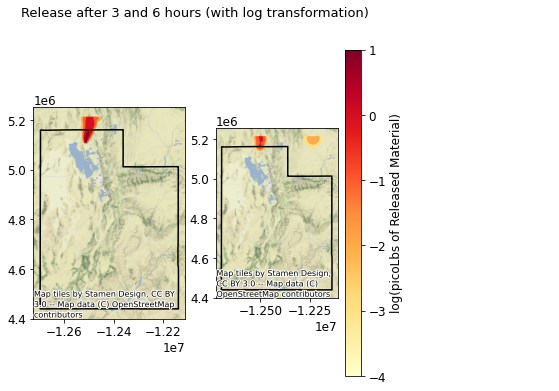

In [136]:
#PATH = 'C:\\Users\\u0890227\\Desktop\\TRI_HYSPLIT\\HO_110000468921_71432_40.84_-111.92_0.00_90_01_01_00\\'
PATH = 'data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_00/'

#Load the data
hour3 = gpd.read_file(PATH + 'hour_after_start_6')
hour3 = gpd.GeoDataFrame(hour3,crs=hour3.crs)
hour3['CONC']=hour3['CONC'].astype(float)
hour3 = hour3.to_crs('epsg:3857')

hour6 =  gpd.read_file(PATH + 'hour_after_start_9')
hour6 = gpd.GeoDataFrame(hour6,crs=hour6.crs)
hour6['CONC']=hour6['CONC'].astype(float)
hour6 = hour6.to_crs('epsg:3857')

#Plot the plumes
fig,ax = plt.subplots(1,2,figsize=(6,6))
state_gdf[state_gdf['STATE']=='Utah'].boundary.plot(ax=ax[0],color='k')
hour3.plot(cmap='YlOrRd',
            ax=ax[0],
            column='CONC',vmin=-4,vmax=1)
ctx.add_basemap(ax[0])

state_gdf[state_gdf['STATE']=='Utah'].boundary.plot(ax=ax[1],color='k')
hour6.plot(cmap='YlOrRd',
            ax=ax[1],
            column='CONC',vmin=-4,vmax=1,
            legend = True,
            legend_kwds={'label': "log(picoLbs of Released Material)"})
ctx.add_basemap(ax[1])

fig.tight_layout()


fig.suptitle('Release after 3 and 6 hours (with log transformation)',size=13)
#plt.savefig('sep_releases.png')

In [140]:
#What kind of test data do we have here: 
folder_list=sorted(glob.glob('./data/HO_*'))

#Split into strings for easy access to parts
folder_split_name = [i.split('_') for i in folder_list]

#Examine the releases of interest
print(*folder_list, sep= '\n')

./data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_00
./data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_03
./data/HO_110055233251_7664939_40.73_-112.0_0.00_90_01_01_00
./data/HO_110055233251_7664939_40.73_-112.0_0.00_90_01_01_03
./data/HO_110064119555_7664939_40.71_-111.89_0.00_90_01_01_00
./data/HO_110064119555_7664939_40.71_-111.89_0.00_90_01_01_03
./data/HO_110069446790_123911_41.09_-112.02_0.00_90_01_01_00
./data/HO_110069446790_123911_41.09_-112.02_0.00_90_01_01_03


In [122]:
#Concatenate the output data to a grid
counter = 0
utah_grid_list = []
for entries in folder_list:
    for path in sorted(glob.glob(entries +'/hour*',recursive=True)):
        #This loop goes through all paths within a model pathway (hour3-48)

        #Extract information from model file
        #This is a non-robust solution for where the characters lie within the string. 
        temp = path.split('_')
        FRS_ID = temp[1]
        CAS = temp[2]
        hour_after = datetime.timedelta(hours = int(temp[-1]))
        ymdh= temp[6] +'_'+ temp[7] +'_'+ temp[8] +'_'+temp[9].split('/')[0]
        ymdh=datetime.datetime.strptime(ymdh,'%y_%m_%d_%H')
        ymdh =ymdh + hour_after

        #Load into a geodataframe
        data = gpd.read_file(path)
        data = gpd.GeoDataFrame(data,crs=data.crs)
        data['CONC']=data['CONC'].astype(float)
        data['CAS'] = CAS
        data['FRS_ID']=FRS_ID
        data = data.to_crs('epsg:3857')

        #Check to make sure there is data within the Utah Boundaries
        state_boundary = state_gdf[state_gdf['STATE']=='Utah']
        test_join = (gpd.sjoin(state_boundary,data , how='inner',op='intersects'))
        if test_join.empty:
            print('No part of this shape is within Utah: ' + path)
            continue

        #Merge to grid
        tmp = gpd.sjoin(UTFish,data, how='left',op='intersects')

        #Where shapes overlap, taking the max
        tmp=tmp.sort_values('CONC', ascending=False).drop_duplicates('OID_').sort_index()

        #Remove the log transformation in order to perform spatial sum
        tmp['non_log_CONC'] = np.power(10,tmp['CONC'])

        #Save Entries to a temporary dictionary
        utah_grid_list.append(tmp)
# Concatenate all the grids together, then group by to create a proper dataframe 
utah_grid_df = pd.concat(utah_grid_list)
utah_grid_df = utah_grid_df.groupby(by=['DATE','TIME','OID_']).agg({'non_log_CONC':'sum', 
                        'CAS':'first',
                        'FRS_ID':'first',
                        'geometry':'first'})    

utah_grid_df = utah_grid_df.reset_index()
utah_grid_df['log_CONC'] = np.log10(utah_grid_df['non_log_CONC'])

No part of this shape is within Utah: ./data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_00/hour_after_start_12
No part of this shape is within Utah: ./data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_00/hour_after_start_15
No part of this shape is within Utah: ./data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_00/hour_after_start_18
No part of this shape is within Utah: ./data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_03/hour_after_start_12
No part of this shape is within Utah: ./data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_03/hour_after_start_15
No part of this shape is within Utah: ./data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_03/hour_after_start_18
No part of this shape is within Utah: ./data/HO_110055233251_7664939_40.73_-112.0_0.00_90_01_01_00/hour_after_start_18
No part of this shape is within Utah: ./data/HO_110055233251_7664939_40.73_-112.0_0.00_90_01_01_00/hour_after_start_21
No part of this shape is within Utah: ./data/HO_

In [153]:
utah_grid_df.head(3)

,DATE,TIME,OID_,non_log_CONC,CAS,FRS_ID,geometry,log_CONC
0,19900101,0300,182598,0.001,7664939,110055233251,"POLYGON ((-12471956.724 4965070.617, -12471972...",-3.0
1,19900101,0300,182599,0.001,7664939,110055233251,"POLYGON ((-12470639.680 4965086.135, -12470655...",-3.0
2,19900101,0300,182600,0.001,7664939,110055233251,"POLYGON ((-12469322.629 4965101.475, -12469337...",-3.0


In [129]:
#Helper functions to assist plotting
def file_to_geoframe(path):
    """A function to take a shapefile with concentration element and convert to a geodataframe
    """
    gdf = gpd.read_file(path)
    gdf = gpd.GeoDataFrame(gdf,crs=gdf.crs)
    gdf['CONC']=gdf['CONC'].astype(float)
    gdf = gdf.to_crs('epsg:3857')
    return gdf

def plot_help(my_ax):
     my_ax.tick_params(
        axis='both',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,# ticks along the top edge are off
        left=False,
        labelbottom=False,
        labelleft=False) # labels along the bottom edge are off


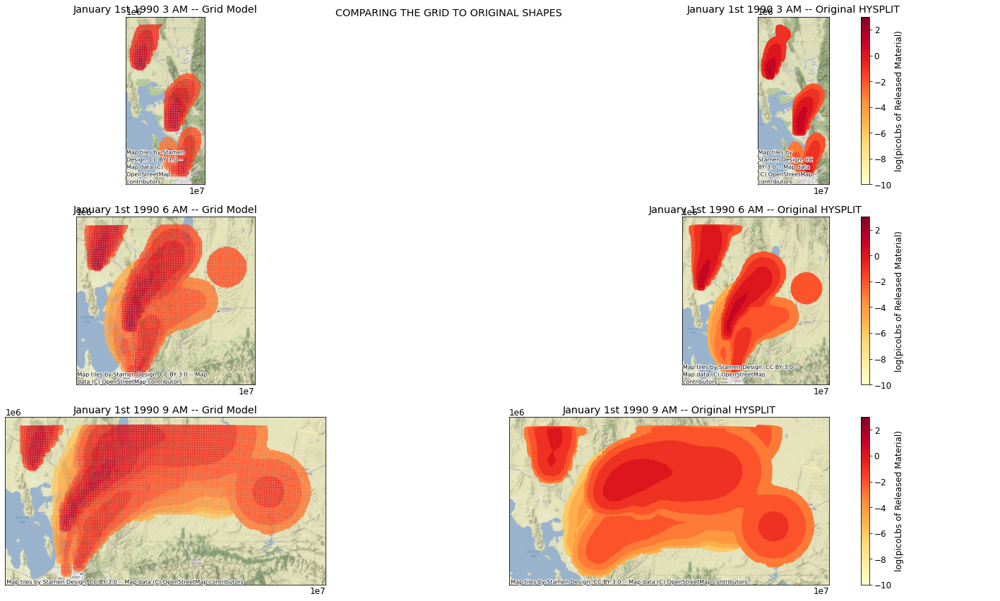

In [131]:
fig,ax = plt.subplots(3,2,figsize=(24,12))
fig.suptitle('COMPARING THE GRID TO ORIGINAL SHAPES')

#Selecting the data from the third hour (have to reiniatalize as as a geodataframe with crs)
_1990_01_01_03 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "0300")], geometry=utah_grid_df['geometry'])
_1990_01_01_03.crs = 'epsg:3857'

#Plot ^^
_1990_01_01_03.plot(cmap='YlOrRd',
                   ax=ax[0,0],
                   column='log_CONC',vmin=-10,vmax=3)

ctx.add_basemap(ax[0,0])


 #Selecting the data from the third hour (have to reiniatalize as as a geodataframe with crs)
_1990_01_01_06 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "0600")], geometry=utah_grid_df['geometry'])
_1990_01_01_06.crs = 'epsg:3857'

#Plot ^^
_1990_01_01_06.plot(cmap='YlOrRd',
                   ax=ax[1,0],
                   column='log_CONC',vmin=-10,vmax=3)

ctx.add_basemap(ax[1,0])

#Selecting the data from the third hour (have to reiniatalize as as a geodataframe with crs)
_1990_01_01_09 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "0900")], geometry=utah_grid_df['geometry'])
_1990_01_01_09.crs = 'epsg:3857'

#Plot ^^
_1990_01_01_09.plot(cmap='YlOrRd',
                   ax=ax[2,0],
                   column='log_CONC',vmin=-10,vmax=3)

ctx.add_basemap(ax[2,0])

#++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
#Need to load the data per each time point
r1_PATH = './data/HO_110032607329_123911_41.66_-112.43_0.00_90_01_01_00/'
r2_PATH = './data/HO_110055233251_7664939_40.73_-112.0_0.00_90_01_01_00/'
r3_PATH = './data/HO_110064119555_7664939_40.71_-111.89_0.00_90_01_01_00/'
r4_PATH = './data/HO_110069446790_123911_41.09_-112.02_0.00_90_01_01_00/'

#Load the data (this will ignore the second release)
r1_1990_01_01_03 = file_to_geoframe(r1_PATH + 'hour_after_start_3')
r2_1990_01_01_03 = file_to_geoframe(r2_PATH + 'hour_after_start_3')
r3_1990_01_01_03 = file_to_geoframe(r3_PATH + 'hour_after_start_3')
r4_1990_01_01_03 = file_to_geoframe(r4_PATH + 'hour_after_start_3')

#Plot
r1_1990_01_01_03.plot(cmap='YlOrRd',
                        ax=ax[0,1],
                        column='CONC',vmin=-10,vmax=3)

r2_1990_01_01_03.plot(cmap='YlOrRd',
                        ax=ax[0,1],
                        column='CONC',vmin=-10,vmax=3)

r3_1990_01_01_03.plot(cmap='YlOrRd',
                        ax=ax[0,1],
                        column='CONC',vmin=-10,vmax=3)

r4_1990_01_01_03.plot(cmap='YlOrRd',
                        ax=ax[0,1],
                        column='CONC',vmin=-10,vmax=3,
                        legend = True,
                        legend_kwds={'label': "log(picoLbs of Released Material)"})

ctx.add_basemap(ax[0,1])


r1_1990_01_01_06 = file_to_geoframe(r1_PATH + 'hour_after_start_6')
r2_1990_01_01_06 = file_to_geoframe(r2_PATH + 'hour_after_start_6')
r3_1990_01_01_06 = file_to_geoframe(r3_PATH + 'hour_after_start_6')
r4_1990_01_01_06 = file_to_geoframe(r4_PATH + 'hour_after_start_6')

#Plot
r1_1990_01_01_06.plot(cmap='YlOrRd',
                        ax=ax[1,1],
                        column='CONC',vmin=-10,vmax=3)

r2_1990_01_01_06.plot(cmap='YlOrRd',
                        ax=ax[1,1],
                        column='CONC',vmin=-10,vmax=3)

r3_1990_01_01_06.plot(cmap='YlOrRd',
                        ax=ax[1,1],
                        column='CONC',vmin=-10,vmax=3)

r4_1990_01_01_06.plot(cmap='YlOrRd',
                        ax=ax[1,1],
                        column='CONC',vmin=-10,vmax=3,
                        legend = True,
                        legend_kwds={'label': "log(picoLbs of Released Material)"})

ctx.add_basemap(ax[1,1])
r1_1990_01_01_09 = file_to_geoframe(r1_PATH + 'hour_after_start_9')
r2_1990_01_01_09 = file_to_geoframe(r2_PATH + 'hour_after_start_9')
r3_1990_01_01_09 = file_to_geoframe(r3_PATH + 'hour_after_start_9')
r4_1990_01_01_09 = file_to_geoframe(r4_PATH + 'hour_after_start_9')

#Plot
r1_1990_01_01_09.plot(cmap='YlOrRd',
                        ax=ax[2,1],
                        column='CONC',vmin=-10,vmax=3)

r2_1990_01_01_09.plot(cmap='YlOrRd',
                        ax=ax[2,1],
                        column='CONC',vmin=-10,vmax=3)

r3_1990_01_01_09.plot(cmap='YlOrRd',
                        ax=ax[2,1],
                        column='CONC',vmin=-10,vmax=3)

r4_1990_01_01_09.plot(cmap='YlOrRd',
                        ax=ax[2,1],
                        column='CONC',vmin=-10,vmax=3,
                        legend = True,
                        legend_kwds={'label': "log(picoLbs of Released Material)"})
ctx.add_basemap(ax[2,1])

ax[0,0].title.set_text('January 1st 1990 3 AM -- Grid Model')
ax[1,0].title.set_text('January 1st 1990 6 AM -- Grid Model')
ax[2,0].title.set_text('January 1st 1990 9 AM -- Grid Model')
ax[0,1].title.set_text('January 1st 1990 3 AM -- Original HYSPLIT')
ax[1,1].title.set_text('January 1st 1990 6 AM -- Original HYSPLIT')
ax[2,1].title.set_text('January 1st 1990 9 AM -- Original HYSPLIT')

plot_help(ax[0,0])
plot_help(ax[1,0])
plot_help(ax[2,0])
plot_help(ax[0,1])
plot_help(ax[1,1])
plot_help(ax[2,1])

plt.tight_layout()
#plt.savefig('release_comparison.png')

TO DO:
<br>
1. Forward geodataframes to Heidi for processing
<br>
    - based on this information, there will be a total of 3 releases, each for the first and 3rd hour of January 1st 1990
    <br>
2. Visualization - Several model simulations with summed values - DONE
<br>
3. Try quantification of error with hysplit
<br>
4. Of chemicals which we have validation data for... what is the breakdown of gas part stack fug - DONE 


## Saving data as shapefiles

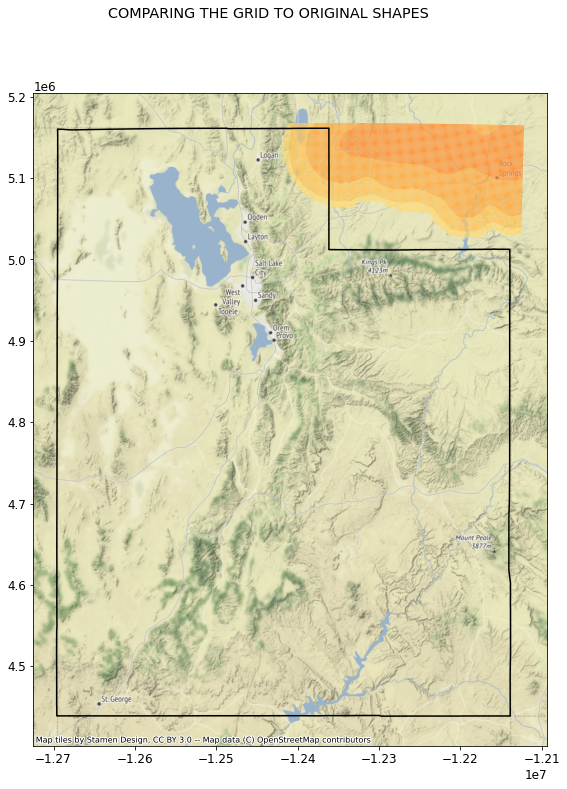

In [180]:
fig,ax = plt.subplots(1,1,figsize=(24,12))
fig.suptitle('COMPARING THE GRID TO ORIGINAL SHAPES')

#Selecting the data from the third hour (have to reiniatalize as as a geodataframe with crs)
_1990_01_01_18 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "1800")], geometry=utah_grid_df['geometry'])
_1990_01_01_18.crs = 'epsg:3857'

#Plot ^^
_1990_01_01_18.plot(cmap='YlOrRd',
                   ax=ax,
                   column='log_CONC',vmin=-10,vmax=3)
state_gdf[state_gdf['STATE']=='Utah'].boundary.plot(ax=ax,color='k')

ctx.add_basemap(ax)

In [170]:
#Getting some uploads done
_1990_01_01_03 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "0300")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_01_03/'
os.makedirs(direct)
_1990_01_01_03.to_file(direct+"/_1990_01_01_03.shp")

_1990_01_01_06 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "0600")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_01_06/'
os.makedirs(direct)
_1990_01_01_06.to_file(direct+"/_1990_01_01_06.shp")

_1990_01_01_09 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "0900")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_01_09/'
os.makedirs(direct)
_1990_01_01_09.to_file(direct+"/_1990_01_01_09.shp")

_1990_01_01_12 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "1200")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_01_12/'
os.makedirs(direct)
_1990_01_01_12.to_file(direct+"/_1990_01_01_12.shp")

_1990_01_01_15 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "1500")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_01_15/'
os.makedirs(direct)
_1990_01_01_15.to_file(direct+"/_1990_01_01_15.shp")

_1990_01_01_18 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "1800")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_01_18/'
os.makedirs(direct)
_1990_01_01_18.to_file(direct+"/_1990_01_01_18.shp")

_1990_01_01_21 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900101') & (utah_grid_df['TIME'] == "2100")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_01_21/'
os.makedirs(direct)
_1990_01_01_21.to_file(direct+"/_1990_01_01_21.shp")

_1990_01_02_00 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900102') & (utah_grid_df['TIME'] == "0000")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_02_00/'
os.makedirs(direct)
_1990_01_02_00.to_file(direct+"/_1990_01_02_00.shp")

_1990_01_02_03 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900102') & (utah_grid_df['TIME'] == "0300")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_02_03/'
os.makedirs(direct)
_1990_01_02_03.to_file(direct+"/_1990_01_02_03.shp")

_1990_01_02_06 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900102') & (utah_grid_df['TIME'] == "0600")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_02_06/'
os.makedirs(direct)
_1990_01_02_06.to_file(direct+"/_1990_01_02_06.shp")

_1990_01_02_09 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900102') & (utah_grid_df['TIME'] == "0900")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_02_09/'
os.makedirs(direct)
_1990_01_02_09.to_file(direct+"/_1990_01_02_09.shp")

_1990_01_02_12 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900102') & (utah_grid_df['TIME'] == "1200")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_02_12/'
os.makedirs(direct)
_1990_01_02_12.to_file(direct+"/_1990_01_02_12.shp")

_1990_01_02_15 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900102') & (utah_grid_df['TIME'] == "1500")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_02_15/'
os.makedirs(direct)
_1990_01_02_15.to_file(direct+"/_1990_01_02_15.shp")

_1990_01_02_18 = gpd.GeoDataFrame(utah_grid_df[(utah_grid_df['DATE']=='19900102') & (utah_grid_df['TIME'] == "1800")], geometry=utah_grid_df['geometry'])
direct = './data/grid_shapes/_1990_01_02_18/'
os.makedirs(direct)
_1990_01_02_18.to_file(direct+"/_1990_01_02_18.shp")
